<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

## Project 2 - Ames Housing Data and Kaggle Challenge
(Part 2 of 3)


---

### Part Two: 
3. Preprocessing and Modeling
4. Evaluation and Conceptual Understanding


### Preprocessing

In [76]:
# Imports
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Import sklearn train_test_split
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import metrics

# Import sklearn logistic regression
from sklearn.linear_model import LogisticRegression, LinearRegression, LassoCV, RidgeCV
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_iterative_imputer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer

#set_style
plt.style.use('fivethirtyeight')
#configure for retina display
%config InlineBackend.figure_format = 'retina'

**Reading the cleaned up data.**

In [77]:
# Read the cleaned set of train data.
df = pd.read_csv('output/cleaned_train_no_outlier.csv')
df.drop(columns='Unnamed: 0', inplace=True) # Drop the unnamed column.
print(df.shape)
df.head()

(2045, 69)


,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Fence,Misc Feature,Misc Val,SalePrice,Bsmt Liv Area,Have alley,Garage
0,109,533352170,60,RL,69.1,13517,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,0,475.0,TA,TA,Y,0,44,0,0,0,0,0,0,0,130500,533.0,0,1
1,544,531379050,60,RL,43.0,11492,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,Gd,TA,PConc,Gd,TA,No,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,559.0,TA,TA,Y,0,74,0,0,0,0,0,0,0,220000,637.0,0,1
2,153,535304180,20,RL,68.0,7922,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0,0.0,1,0,3,1,Gd,5,Typ,0,0,246.0,TA,TA,Y,0,52,0,0,0,0,0,0,0,109000,731.0,0,1
3,318,916386060,60,RL,73.0,9802,Pave,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0,0.0,2,1,3,1,TA,7,Typ,0,0,400.0,TA,TA,Y,100,0,0,0,0,0,0,0,0,174000,0.0,0,1
4,255,906425045,50,RL,82.0,14235,Pave,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,TA,PConc,Fa,Gd,No,GasA,TA,Y,SBrkr,831,614,0,1445,0.0,0.0,2,0,3,1,TA,6,Typ,0,0,484.0,TA,TA,N,0,59,0,0,0,0,0,0,0,138500,0.0,0,1


In [78]:
# Changing all the column names to lower case and replacing space with underscore. 
df.columns = df.columns.str.lower().str.replace(' ', '_')

In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2045 entries, 0 to 2044
Data columns (total 69 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               2045 non-null   int64  
 1   pid              2045 non-null   int64  
 2   ms_subclass      2045 non-null   int64  
 3   ms_zoning        2045 non-null   object 
 4   lot_frontage     2045 non-null   float64
 5   lot_area         2045 non-null   int64  
 6   street           2045 non-null   object 
 7   lot_shape        2045 non-null   object 
 8   land_contour     2045 non-null   object 
 9   utilities        2045 non-null   object 
 10  lot_config       2045 non-null   object 
 11  land_slope       2045 non-null   object 
 12  neighborhood     2045 non-null   object 
 13  condition_1      2045 non-null   object 
 14  condition_2      2045 non-null   object 
 15  bldg_type        2045 non-null   object 
 16  house_style      2045 non-null   object 
 17  overall_qual  

**Assign numerical values to the Ordinal columns.**

In [80]:
# Identifying the ordinal columns.
df_ordinal_col = df[['lot_shape','utilities','ms_zoning','street','land_slope','exter_qual', 'exter_cond','bsmt_qual', 'bsmt_cond', 'bsmt_exposure', 'heating_qc','electrical','kitchen_qual','functional','fireplace_qu','garage_qual','garage_cond','paved_drive', 'fence']]

#dictionary of values I want to replace
dict_ordinal = {
    #exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,heatingqc,kitchenqual
    #firplacequ,garage_qual,garage_cond,fence
    'Ex': 5,
    'Gd': 4,
    'TA': 3,
    'Fa': 2,
    'Po': 1,
    'NA': 0,
    '0': 0, 
    #ms_zoning: 0 if non residential, 1 if residential
    'A (agr)':0,
    'I (all)':0,
    'C (all)':0,
    'RM':1,
    'RH':1,
    'RL':1,
    'FV':1,
     #lot_shape
    'Reg':4,
    'IR1':3,
    'IR2':2,
    'IR3':1,
    #street: 0 for gravel since it's cheaper ie lower grade, 1 for pave
    'Pave': 1,
    'Grvl': 0,
    #utilities
    'AllPub':4,
    'NoSewr':3,
    'NoSeWa':2,
    'ELO':1,
    #land_slope
    'Gtl':3,
    'Mod':2,
    'Sev':1,
    #bsmt_exposure
    'Av': 3,
    'Mn': 2,
    'No': 1,
    #Electrical
    'SBrkr':1,
    'FuseA':0,
    'FuseF':0,
    'FuseP':0,
    'Mix':0,
    #Functional
    'Typ':1,
    'Min1':0,
    'Min2':0,
    'Mod':0,
    'Maj1':0,
    'Maj2':0,
    'Sev':0,
    'Sal':0,
    #paved_drive
    'Y' : 2,
    'P' : 1,
    'N' : 0,
    #fence
    'GdPrv':4,
    'MnPrv':3,
    'GdWo':2,
    'MnWw':1   
}
#loop to get the job done
for i in df_ordinal_col.columns:
    df.replace({i: dict_ordinal},inplace = True)

In [81]:
# Noted that condition_1 and condition_2 can be assigned numberical values.
# Assign 0 to a negative condition, 1 to a normal condition and 2 to a positive condition.
df_ordinal_col = df[['condition_1', 'condition_2']]
dict_ordinal = {
   'Artery':0,
    'RRNe':0,
    'RRAe':0,
    'Feedr':0,
    'RRAn':0,
    'Norm':1,
    'RRNn':0,
    'PosN':2,
    'PosA':2,
        }
#loop to get the job done
for i in df_ordinal_col.columns:
    df.replace({i: dict_ordinal},inplace = True)
# Both condition scores can be combined into 1 column.
df['comb_conditions'] = df['condition_1']+df['condition_2'] 
# Then drop the 2 orig columns.
df = df.drop(columns = ['condition_1', 'condition_2'])

In [82]:
# Checking the number of neighborhoods.
df['neighborhood'].nunique()

28

Because of the number of neighborhoods, my initial attempt to dummify the feature turned out rather messy so I'm returning here to group the neighborhoods first. I first got the idea from [Jesse Villines](https://medium.com/mlearning-ai/a-thorough-dive-into-the-ames-iowa-housing-dataset-part-1-of-5-7205093a5a53) on how this can be done.

In [83]:
# Grouping the neighbourhoods based on median saleprice.
neighborhood_order = df.groupby(by=["neighborhood"]).median().saleprice.sort_values(ascending=False).index

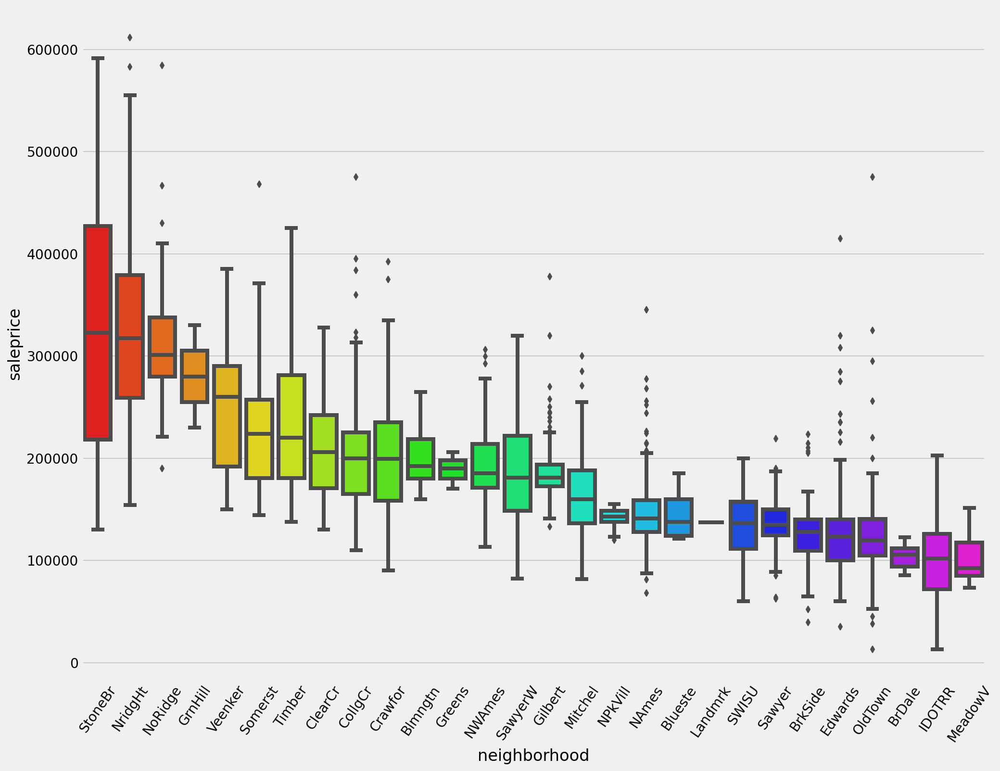

In [84]:
# Create box plot to visualize.
plt.figure(figsize = (15,12))
ax = sns.boxplot(x='neighborhood', y='saleprice', data=df,palette='gist_rainbow', order =neighborhood_order )
ax.set_xticklabels(ax.get_xticklabels(),rotation = 55);

In [85]:
# Assign numerical values to the neighborhoods.
neigh_map={'None': 0,
        'MeadowV':1,'IDOTRR':1,'BrDale':1,
        'OldTown':2,'Edwards':2,
        'BrkSide':3,'Sawyer':3,'SWISU':3,'Landmrk':3,
        'Blueste':4,'NAmes':4,
        'NPkVill':5,'Mitchel':5,'Gilbert':5,
        'SawyerW':6,'NWAmes':6, 'Greens':6,'Blmngtn':6,'Crawfor':6,'CollgCr':6,
        'Timber':7,'Somerst':7,
        'ClearCr':8,'Veenker':8,'GrnHill':8, 
         'StoneBr':9,'NoRidge':9,'NridgHt':9 } 
df['neighborhood_numeric'] =df['neighborhood'].map(neigh_map)

In [86]:
# Check our df as of now.
df.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_feature,misc_val,saleprice,bsmt_liv_area,have_alley,garage,comb_conditions,neighborhood_numeric
0,109,533352170,60,1,69.1,13517,1,3,Lvl,4,CulDSac,3,Sawyer,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,4,3,CBlock,3,3,1,GasA,5,Y,1,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,1,0,0,475.0,3,3,2,0,44,0,0,0,0,0,0,0,130500,533.0,0,1,1,3
1,544,531379050,60,1,43.0,11492,1,3,Lvl,4,CulDSac,3,SawyerW,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,4,3,PConc,4,3,1,GasA,5,Y,1,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,1,1,3,559.0,3,3,2,0,74,0,0,0,0,0,0,0,220000,637.0,0,1,2,6
2,153,535304180,20,1,68.0,7922,1,4,Lvl,4,Inside,3,NAmes,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,4,CBlock,3,3,1,GasA,3,Y,1,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,1,0,0,246.0,3,3,2,0,52,0,0,0,0,0,0,0,109000,731.0,0,1,2,4
3,318,916386060,60,1,73.0,9802,1,4,Lvl,4,Inside,3,Timber,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,3,PConc,4,3,1,GasA,4,Y,1,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,1,0,0,400.0,3,3,2,100,0,0,0,0,0,0,0,0,174000,0.0,0,1,2,7
4,255,906425045,50,1,82.0,14235,1,3,Lvl,4,Inside,3,SawyerW,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,3,3,PConc,2,4,1,GasA,3,Y,1,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,1,0,0,484.0,3,3,0,0,59,0,0,0,0,0,0,0,138500,0.0,0,1,2,6


In [87]:
# Drop 'neighborhood' column since we have the numeric column now.
df = df.drop(columns = ['neighborhood'])

**Preparing our X features and target y.**

In [88]:
# Create our features matrix X.
features = [col for col in df.columns if col != 'saleprice']

In [89]:
# Preparing our X variables.
X = df[features]

# Doing one hot encoding to the nominal columns.
X = pd.get_dummies(data=X, columns=['land_contour', 'lot_config', 'bldg_type',
                                    'house_style', 'roof_style', 'roof_matl', 'exterior_1st', 'exterior_2nd', 'mas_vnr_type', 
                                    'foundation', 'heating', 'central_air', 'misc_feature'], drop_first=True)

In [90]:
# Using this so I can see every row in the cell below.
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [91]:
# Double checking that I have no more dtypes = object.
X.dtypes

id                        int64
pid                       int64
ms_subclass               int64
ms_zoning                 int64
lot_frontage            float64
lot_area                  int64
street                    int64
lot_shape                 int64
utilities                 int64
land_slope                int64
overall_qual              int64
overall_cond              int64
year_built                int64
year_remod/add            int64
mas_vnr_area            float64
exter_qual                int64
exter_cond                int64
bsmt_qual                 int64
bsmt_cond                 int64
bsmt_exposure             int64
heating_qc                int64
electrical                int64
1st_flr_sf                int64
2nd_flr_sf                int64
low_qual_fin_sf           int64
gr_liv_area               int64
bsmt_full_bath          float64
bsmt_half_bath          float64
full_bath                 int64
half_bath                 int64
bedroom_abvgr             int64
kitchen_

In [92]:
# Do a check thus far.
print(X.shape) # many more columns because of the dummifying.
X.head()

(2045, 127)


,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,utilities,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,heating_qc,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,bsmt_liv_area,have_alley,garage,comb_conditions,neighborhood_numeric,land_contour_HLS,land_contour_Low,land_contour_Lvl,lot_config_CulDSac,lot_config_FR2,lot_config_FR3,lot_config_Inside,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,roof_style_Gable,roof_style_Gambrel,roof_style_Hip,roof_style_Mansard,roof_style_Shed,roof_matl_Membran,roof_matl_Tar&Grv,roof_matl_WdShake,roof_matl_WdShngl,exterior_1st_AsphShn,exterior_1st_BrkComm,exterior_1st_BrkFace,exterior_1st_CBlock,exterior_1st_CemntBd,exterior_1st_HdBoard,exterior_1st_ImStucc,exterior_1st_MetalSd,exterior_1st_Plywood,exterior_1st_Stone,exterior_1st_Stucco,exterior_1st_VinylSd,exterior_1st_Wd Sdng,exterior_1st_WdShing,exterior_2nd_AsphShn,exterior_2nd_Brk Cmn,exterior_2nd_BrkFace,exterior_2nd_CBlock,exterior_2nd_CmentBd,exterior_2nd_HdBoard,exterior_2nd_ImStucc,exterior_2nd_MetalSd,exterior_2nd_Plywood,exterior_2nd_Stone,exterior_2nd_Stucco,exterior_2nd_VinylSd,exterior_2nd_Wd Sdng,exterior_2nd_Wd Shng,mas_vnr_type_BrkCmn,mas_vnr_type_BrkFace,mas_vnr_type_None,mas_vnr_type_Stone,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,heating_GasW,heating_Grav,heating_OthW,heating_Wall,central_air_Y,misc_feature_Gar2,misc_feature_Othr,misc_feature_Shed,misc_feature_TenC
0,109,533352170,60,1,69.1,13517,1,3,4,3,6,8,1976,2005,289.0,4,3,3,3,1,5,1,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,1,0,0,475.0,3,3,2,0,44,0,0,0,0,0,0,533.0,0,1,1,3,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
1,544,531379050,60,1,43.0,11492,1,3,4,3,7,5,1996,1997,132.0,4,3,4,3,1,5,1,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,1,1,3,559.0,3,3,2,0,74,0,0,0,0,0,0,637.0,0,1,2,6,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
2,153,535304180,20,1,68.0,7922,1,4,4,3,5,7,1953,2007,0.0,3,4,3,3,1,3,1,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,1,0,0,246.0,3,3,2,0,52,0,0,0,0,0,0,731.0,0,1,2,4,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
3,318,916386060,60,1,73.0,9802,1,4,4,3,5,5,2006,2007,0.0,3,3,4,3,1,4,1,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,1,0,0,400.0,3,3,2,100,0,0,0,0,0,0,0,0.0,0,1,2,7,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
4,255,906425045,50,1,82.0,14235,1,3,4,3,6,8,1900,1993,0.0,3,3,2,4,1,3,1,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,1,0,0,484.0,3,3,0,0,59,0,0,0,0,0,0,0.0,0,1,2,6,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0


In [93]:
# Defining our target y.
y = df['saleprice']

In [94]:
# Putting them together just to do a quick plot below.
df = X.join(y)
df.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,utilities,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,heating_qc,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,bsmt_liv_area,have_alley,garage,comb_conditions,neighborhood_numeric,land_contour_HLS,land_contour_Low,land_contour_Lvl,lot_config_CulDSac,lot_config_FR2,lot_config_FR3,lot_config_Inside,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,roof_style_Gable,roof_style_Gambrel,roof_style_Hip,roof_style_Mansard,roof_style_Shed,roof_matl_Membran,roof_matl_Tar&Grv,roof_matl_WdShake,roof_matl_WdShngl,exterior_1st_AsphShn,exterior_1st_BrkComm,exterior_1st_BrkFace,exterior_1st_CBlock,exterior_1st_CemntBd,exterior_1st_HdBoard,exterior_1st_ImStucc,exterior_1st_MetalSd,exterior_1st_Plywood,exterior_1st_Stone,exterior_1st_Stucco,exterior_1st_VinylSd,exterior_1st_Wd Sdng,exterior_1st_WdShing,exterior_2nd_AsphShn,exterior_2nd_Brk Cmn,exterior_2nd_BrkFace,exterior_2nd_CBlock,exterior_2nd_CmentBd,exterior_2nd_HdBoard,exterior_2nd_ImStucc,exterior_2nd_MetalSd,exterior_2nd_Plywood,exterior_2nd_Stone,exterior_2nd_Stucco,exterior_2nd_VinylSd,exterior_2nd_Wd Sdng,exterior_2nd_Wd Shng,mas_vnr_type_BrkCmn,mas_vnr_type_BrkFace,mas_vnr_type_None,mas_vnr_type_Stone,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,heating_GasW,heating_Grav,heating_OthW,heating_Wall,central_air_Y,misc_feature_Gar2,misc_feature_Othr,misc_feature_Shed,misc_feature_TenC,saleprice
0,109,533352170,60,1,69.1,13517,1,3,4,3,6,8,1976,2005,289.0,4,3,3,3,1,5,1,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,1,0,0,475.0,3,3,2,0,44,0,0,0,0,0,0,533.0,0,1,1,3,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,130500
1,544,531379050,60,1,43.0,11492,1,3,4,3,7,5,1996,1997,132.0,4,3,4,3,1,5,1,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,1,1,3,559.0,3,3,2,0,74,0,0,0,0,0,0,637.0,0,1,2,6,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,220000
2,153,535304180,20,1,68.0,7922,1,4,4,3,5,7,1953,2007,0.0,3,4,3,3,1,3,1,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,1,0,0,246.0,3,3,2,0,52,0,0,0,0,0,0,731.0,0,1,2,4,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,109000
3,318,916386060,60,1,73.0,9802,1,4,4,3,5,5,2006,2007,0.0,3,3,4,3,1,4,1,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,1,0,0,400.0,3,3,2,100,0,0,0,0,0,0,0,0.0,0,1,2,7,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,174000
4,255,906425045,50,1,82.0,14235,1,3,4,3,6,8,1900,1993,0.0,3,3,2,4,1,3,1,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,1,0,0,484.0,3,3,0,0,59,0,0,0,0,0,0,0.0,0,1,2,6,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,138500


In [95]:
# To export the data.
df.to_csv('output/df.csv')

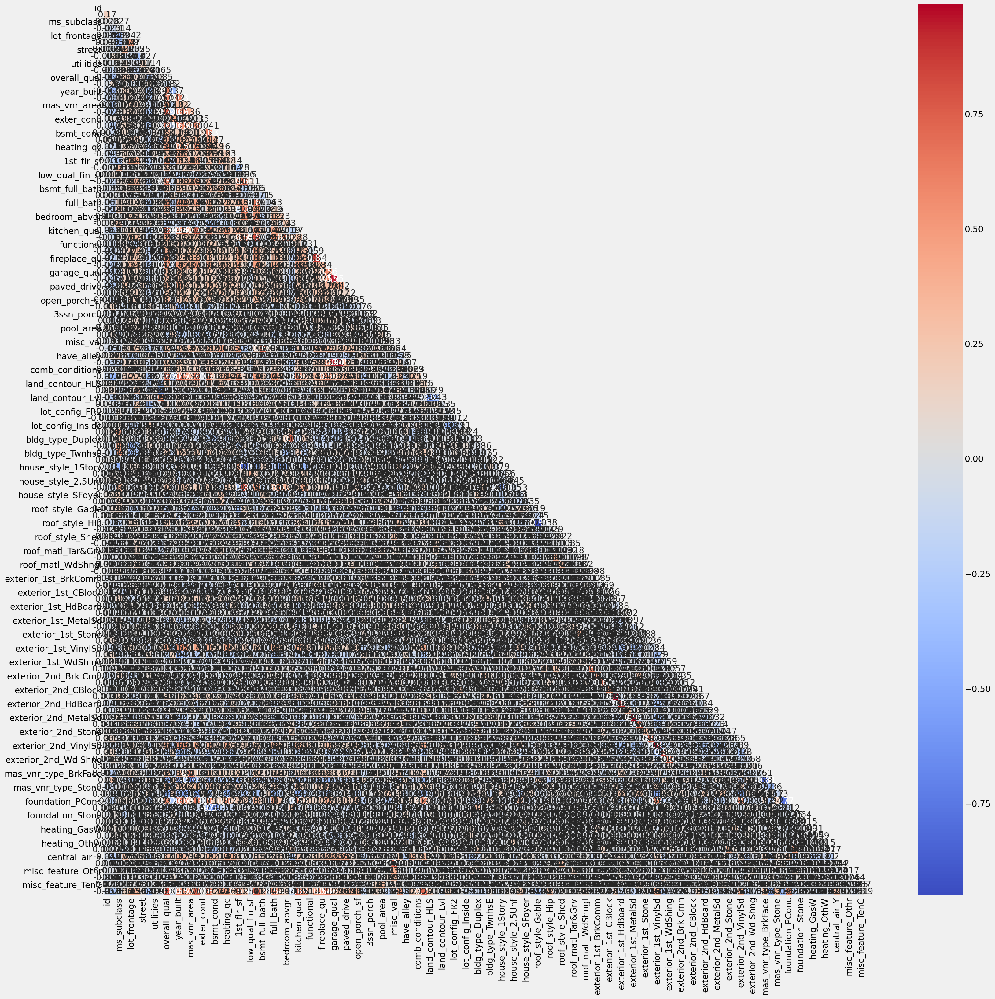

In [96]:
# Check for correlations.
plt.figure(figsize=(25,25))
# corr = df.corr()

mask = np.zeros_like(df.corr())
mask[np.triu_indices_from(mask)] = True
sns.heatmap(df.corr(), mask = mask, annot = True, cmap='coolwarm');

Poor visualization. Guess I should have expected that since there are so many columns. Will try another way below.

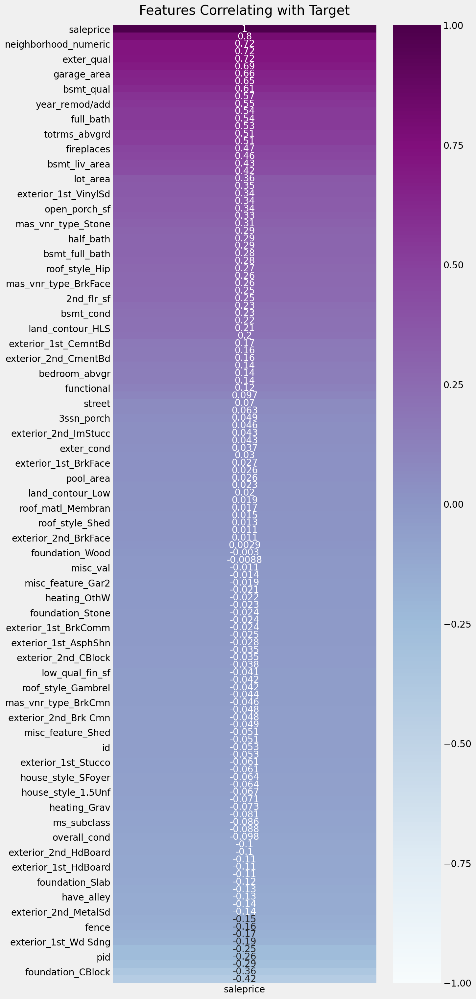

In [97]:
plt.figure(figsize=(8, 25))
heatmap = sns.heatmap(df.corr()[['saleprice']].sort_values(by='saleprice', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BuPu')
heatmap.set_title('Features Correlating with Target', fontdict={'fontsize':20}, pad=16);

Although more pleasing to the eye, also quite a hassle to go row by row in picking out the features that show significant correlation to saleprice. So I do the sieving out below.

In [98]:
# Filter to only 'saleprice' col as that is our target.
# sort_values so it returns largest few. 
p_val = df.corr()['saleprice'].sort_values(ascending=False)

# filtering to top correlated features with pearson coeff > 0.5
p_val_high = p_val[p_val>0.5]

p_val_high

saleprice               1.000000
overall_qual            0.803817
neighborhood_numeric    0.724478
gr_liv_area             0.719362
exter_qual              0.717104
kitchen_qual            0.693969
garage_area             0.655311
1st_flr_sf              0.647586
bsmt_qual               0.612999
year_built              0.573644
year_remod/add          0.550708
fireplace_qu            0.538855
full_bath               0.537529
foundation_PConc        0.532792
totrms_abvgrd           0.511499
mas_vnr_area            0.511132
Name: saleprice, dtype: float64

We can get an overview of the features that have a significant correlation to saleprice. 

**Do Train-Test Split**

In [99]:
# Do a train test split. Using default of test 25%.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=42) 
# I had to remove the stratify otherwise the train test split could not succeed. 
# Apparently stratify in this case will cause a case where y is too small, so I'll just have to leave it out.

**Scale Variables**

In [100]:
ss = StandardScaler() # instantiate 
X_train_sc = ss.fit_transform(X_train) # fit + transform training set
X_test_sc = ss.transform(X_test) # transform testing set using fit learning from trained set 

### Modeling and Evaluation

Before I begin to model, I start off by getting a baseline score so I can measure my models' score against later.

In [101]:
df['y_avgsaleprice'] = df['saleprice'].mean()

In [102]:
RMSE = metrics.mean_squared_error(y_true=df['saleprice'], y_pred=df['y_avgsaleprice'])**.5
print(f'Mean of Root Squared Error in dollars : {round(RMSE,2)}.')

Mean of Root Squared Error in dollars : 79239.7.


I'll be doing up 3 models - linear regression, lasso and ridge to see which performs best.

**Linear Regression**

In [103]:
# Instantiate the model.
lr = LinearRegression()

In [104]:
lr_scores = cross_val_score(lr, X_train_sc, y_train, cv=3)
lr_scores.mean()

-9.934441361942913e+19

The cv score is very poor. May not serve any purpose to fit and train the model. But will do it below anyway.

In [105]:
# Fit the model.
lr.fit(X_train_sc, y_train)

LinearRegression()

In [106]:
# Scores.
print(lr.score(X_train_sc, y_train))
print(lr.score(X_test_sc, y_test))

0.9180230514695905
-7165693233507.447


As expected from the poor cv score, model predicts poorly. But it's worth noting that model actually trained pretty well as it explains ~92% of the data.

**Lasso**

In [107]:
# Instantiate.
l_alphas = np.linspace(0.5, 1.0, 100)

# Fit.
lasso_cv = LassoCV(alphas=l_alphas, cv=5, max_iter=10000000).fit(X_train_sc, y_train);

In [108]:
# Scores.
print(lasso_cv.score(X_train_sc, y_train))
print(lasso_cv.score(X_test_sc, y_test))

0.91801935276968
0.8892993384699903


Decent scores with model explaining ~92% of train data and ~89% of test data. 

In [109]:
# cross val score on lasso model.
lasso_scores = cross_val_score(lasso_cv, X_train_sc, y_train, cv=5)
lasso_scores.mean()

0.8863117932526396

With the close R2 scores and this cv score being just as close, it does seem Lasso is a good model for us to adopt.

In [110]:
# Get my lasso predictions and compare with y_test values.
lasso_pred = lasso_cv.predict(X_test_sc)

y_test[:5], lasso_pred[:5]

(305     120000
 1283    189500
 368     155000
 479     441929
 1537    165000
 Name: saleprice, dtype: int64,
 array([126213.69761964, 190891.82519087, 150853.1793355 , 395863.63876142,
        143313.97735589]))

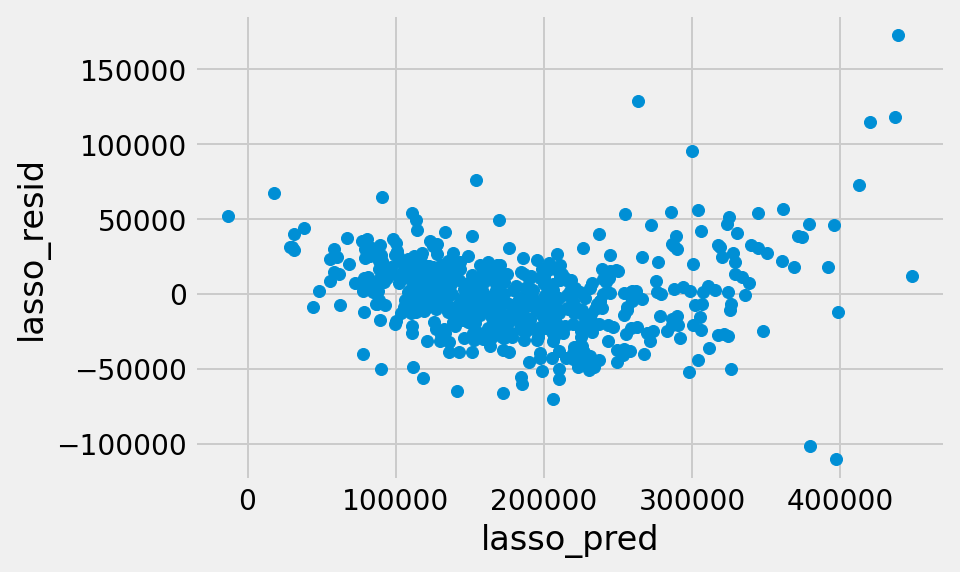

In [111]:
# Plot predictions against residuals.
lasso_resid = y_test - lasso_pred
plt.xlabel('lasso_pred')
plt.ylabel('lasso_resid');
plt.scatter(lasso_pred,lasso_resid);

If the residuals are mostly around 0, it means the predictions are almost perfect. Although it does seem like the case here, let's not overlook the scale of the vertical axis. With that taken into consideration, the deviation is averaging about $50 000.

In [112]:
# RMSE
np.sqrt(metrics.mean_squared_error(y_test, lasso_pred))

26297.20811667791

I also decided to try another metric to check - RMSE. The big number kind of scared me but I was told RMSE < 40 000 is ok and < 20 000 is good. So this figure I got isn't all that bad! 

In [113]:
# Checking out the lasso_cv coeff.
lasso_cv.coef_

array([ 4.20475859e+02, -1.53045148e+03, -5.26817518e+03,  1.17965290e+02,
        1.25902262e+03,  5.73012518e+03, -1.63067338e+02,  1.04727446e+03,
        1.29637467e+03,  1.06485084e+00,  1.23189259e+04,  5.19593988e+03,
        2.67932690e+03,  1.14324742e+03,  7.65767660e+03,  6.10888328e+03,
       -1.04617836e+03,  5.32267167e+03, -8.38502616e+02,  5.95765173e+03,
        1.02967618e+03, -6.69811575e+02,  1.94145666e+04,  2.03347549e+04,
        1.50409403e+03,  6.25673872e+03,  1.23236273e+03, -5.55107425e+02,
        1.95293139e+00,  3.90500179e+02, -4.09410924e+03, -2.80266402e+03,
        4.72489063e+03,  2.35003196e+03,  3.68800227e+03,  1.56350662e+02,
        1.57977894e+03,  5.95973203e+03,  5.12974228e+03, -3.87431602e+03,
        1.29216128e+03,  8.53934430e+02,  6.44622531e+02,  6.96880751e+02,
        5.95857998e+02,  3.50117391e+03,  5.02771276e+02,  4.26410906e+02,
        6.11014262e+02,  8.56330413e+03, -8.85970983e+02, -3.96075394e+03,
        2.89110107e+03,  

We can see that there are features that have been zeroed out which means they play no part in predicting the saleprice. It only leaves behind the relevant features. Below I try to plot a bar graph to observe the various coefficients but there are just too many features to analyse. So further in the next section, I make use of how lasso zeroes out insignificant features and sieve out the top features that affect saleprice the most in order to be able to formulate a conclusion.

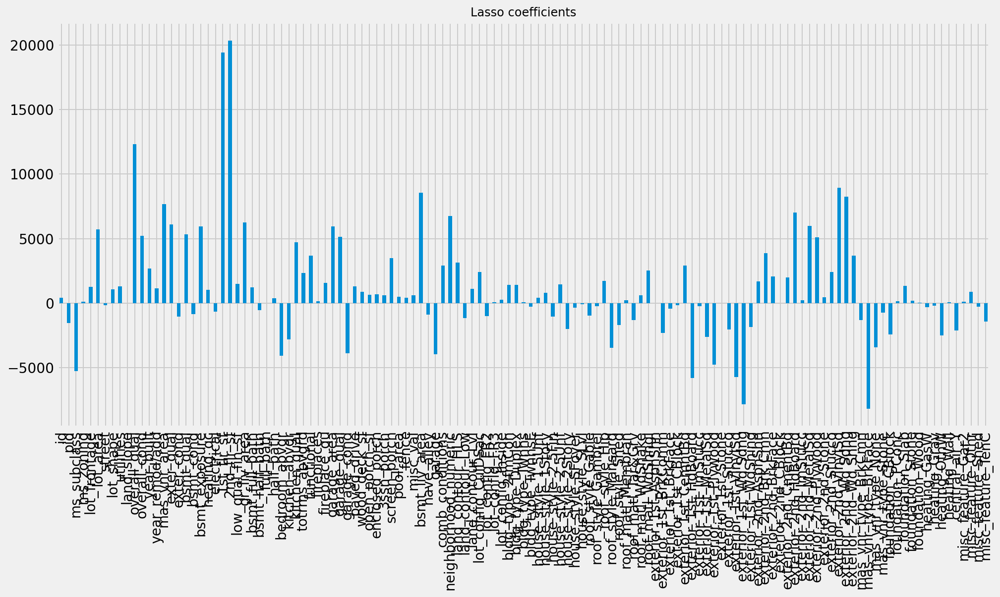

In [120]:
# plotting ridge coefficients with corresponding features
pd.Series(lasso_cv.coef_, index=X.columns).plot.bar(figsize=(15, 7))
plt.title('Lasso coefficients', {'fontsize': 12});

In [40]:
print ('Percent variables zeroed out:', np.sum((lasso_cv.coef_ == 0))/float(X.shape[0]))

Percent variables zeroed out: 0.001466992665036675


In [41]:
pd.Series(lasso_cv.coef_, index=X.columns)[lasso_cv.coef_ == 0]

exterior_1st_AsphShn    0.0
exterior_1st_Stone      0.0
exterior_2nd_CBlock     0.0
dtype: float64

Only 0.1% of features were zeroed out. Managed to pick out those features zeroed out. To interpret that, we can say that there is no point in fitting the exterior with those materials - asphalt shingles, stone and cinder block - as they have no contribution to the saleprice at all.

In [42]:
lasso_coefs = pd.DataFrame({'variable':X.columns,
                            'coef':lasso_cv.coef_,
                            'abs_coef':np.abs(lasso_cv.coef_)})

lasso_coefs.sort_values('abs_coef', inplace=True, ascending=False)

lasso_coefs.head(15)

,variable,coef,abs_coef
23,2nd_flr_sf,20334.754945,20334.754945
22,1st_flr_sf,19414.566649,19414.566649
10,overall_qual,12318.925923,12318.925923
106,exterior_2nd_VinylSd,8945.429112,8945.429112
49,bsmt_liv_area,8563.304127,8563.304127
107,exterior_2nd_Wd Sdng,8267.345384,8267.345384
110,mas_vnr_type_BrkFace,-8184.456873,8184.456873
93,exterior_1st_Wd Sdng,-7833.686335,7833.686335
14,mas_vnr_area,7657.676600,7657.676600
100,exterior_2nd_HdBoard,7021.074864,7021.074864


In [43]:
# Picking out just the top 10.
lassotop10 = lasso_coefs[:10]

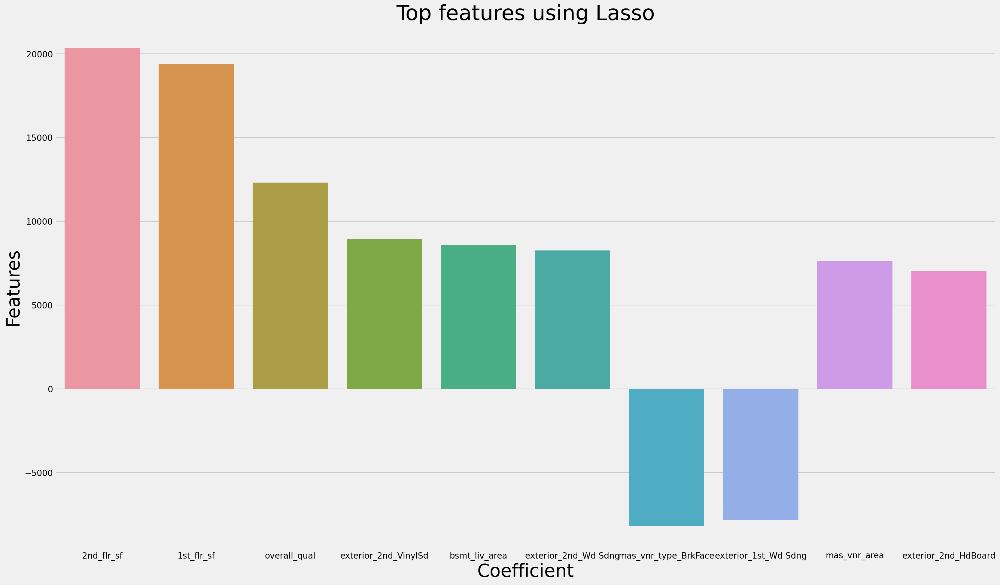

In [44]:
# For a nice visualization.
plt.figure(figsize=(25,15))
sns.barplot(data=lassotop10, x='variable', y='coef')
plt.xticks
plt.title('Top features using Lasso', fontsize = 35)
plt.xlabel('Coefficient', fontsize=30)
plt.ylabel('Features', fontsize = 30);

From the list above, we can visualize the top 10 features easily. With the top feature 2nd flr sf having a coefficient of approximately 20 000, we can say that for every 1 sf increase in the 2nd floor, the saleprice of the house is expected to increase by about $20 000.

In [45]:
# To export the data for our analysis in codebook part 3.
lasso_coefs.to_csv('output/lasso_coefs.csv')

**Ridge**

In [46]:
# Instantiate.
r_alphas = np.logspace(0, 5, 100)

# Fit.
ridge_cv = RidgeCV(alphas=r_alphas, scoring='r2', cv=5).fit(X_train_sc, y_train) 

In [47]:
# Scores.
print(ridge_cv.score(X_train_sc, y_train))
print(ridge_cv.score(X_test_sc, y_test))

0.9143463109944961
0.8920664557938419


Marginally better scores that suggest Ridge works a little better than Lasso. 

In [48]:
# cross_val_score on ridge model.
ridge_scores = cross_val_score(ridge_cv, X_train_sc, y_train, cv=5)
ridge_scores.mean()

0.8928719026104499

With a cv score close to the R2 scores, we can confirm Ridge is the best thus far.  

However the difference in performance between Lasso and Ridge really isn't that far off.

In [49]:
# Get my ridge predictions and compare with y_test values.
ridge_pred = ridge_cv.predict(X_test_sc)

y_test[:5], ridge_pred[:5]

(305     120000
 1283    189500
 368     155000
 479     441929
 1537    165000
 Name: saleprice, dtype: int64,
 array([125132.7862661 , 198452.48511187, 158910.57442064, 381755.91385473,
        145458.78535222]))

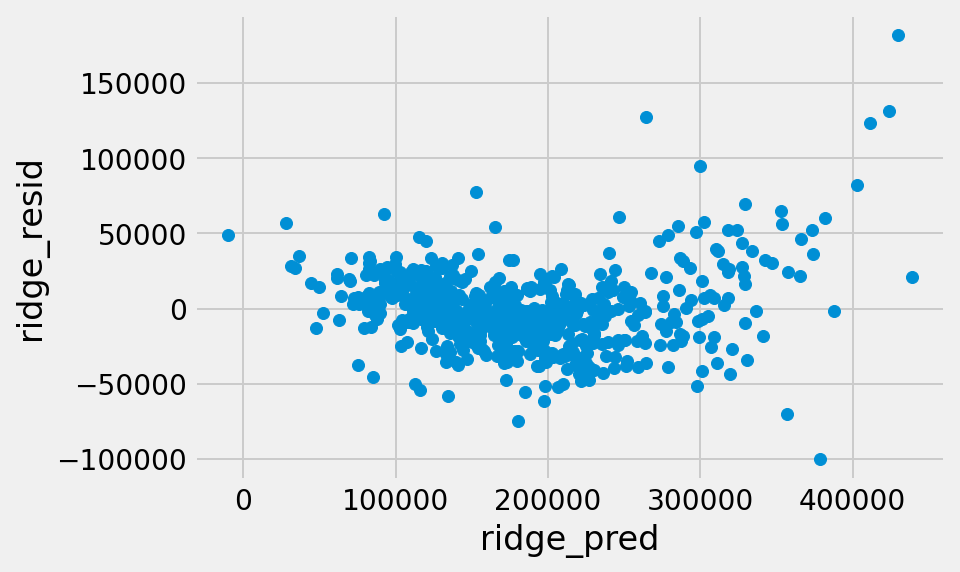

In [50]:
# Plot predictions against residuals.
ridge_resid = y_test - ridge_pred
plt.xlabel('ridge_pred')
plt.ylabel('ridge_resid');
plt.scatter(ridge_pred,ridge_resid);

Similar observation from the lasso residuals plot. 

In [51]:
# RMSE
np.sqrt(metrics.mean_squared_error(y_test, ridge_pred))

25966.46047773817

In comparison, this RMSE value is smaller than that for lasso which implies ridge is a better model to generalize and predict this data.

In [52]:
# Checking out the ridge_cv coeff.
ridge_cv.coef_

array([  393.46892273, -1442.08286366, -2677.68643412,   149.07347676,
        1820.93384291,  5217.00278809,  -147.41763297,   234.6406369 ,
        1103.12829794,  -155.33266121, 10530.81239204,  4171.81708647,
        2007.19493455,  1642.54120335,  6796.14006381,  6400.46527879,
        -460.35256968,  4589.80548692,  -602.88375383,  5555.19796913,
        1133.72967894,  -589.1370438 ,  9417.46498994,  5764.46494849,
         -94.59273383, 12542.79817603,  2153.39930332,  -538.99794216,
        2194.01080021,  1375.78353263, -2253.0191119 , -1824.29937349,
        5524.43187622,  3889.516882  ,  3017.58243062,  1274.94475782,
        2036.72485032,  6051.62374684,  1084.69451114, -1274.56812665,
        1049.42739117,  1422.70218405,  1303.7142718 ,   610.45194259,
         490.20620141,  3490.47953214,   411.21111388,   270.48034428,
         448.56199124,  7569.98459489,  -794.18416214, -1950.64959861,
        2608.23888308,  6586.82571375,  2898.00575309,  -767.92564427,
      

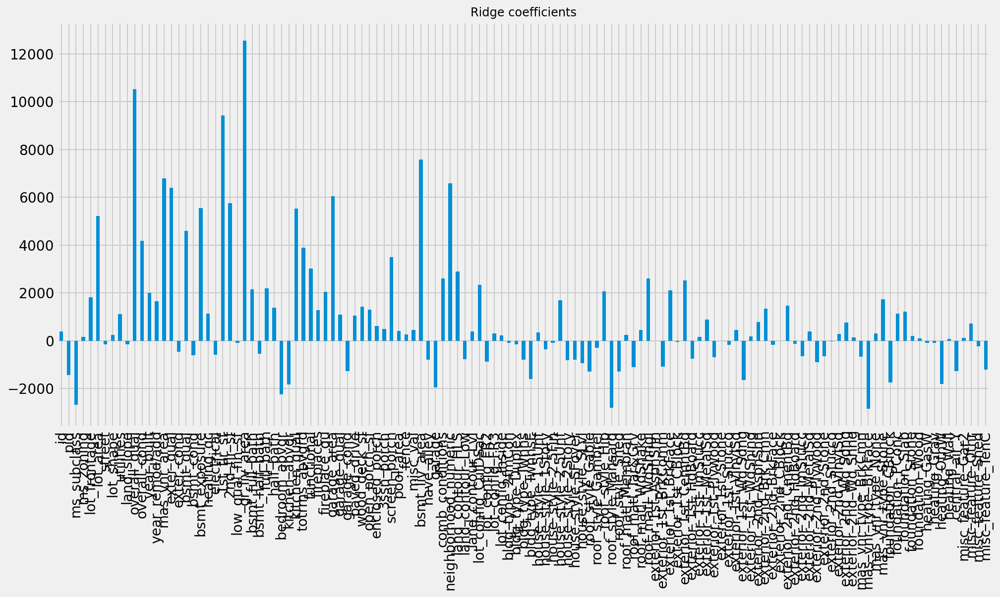

In [53]:
# plotting ridge coefficients with corresponding features
pd.Series(ridge_cv.coef_, index=X.columns).plot.bar(figsize=(15, 7))
plt.title('Ridge coefficients', {'fontsize': 12});

Similarly, many features contribute to the saleprice. Drawing this as an initial visualization but hard to pinpoint any key features from here. Will improve further down.

In [54]:
ridge_coefs = pd.DataFrame({'variable':X.columns,
                            'coef':ridge_cv.coef_,
                            'abs_coef':np.abs(ridge_cv.coef_)})

ridge_coefs.sort_values('abs_coef', inplace=True, ascending=False)

ridge_coefs.head(21)

,variable,coef,abs_coef
25,gr_liv_area,12542.798176,12542.798176
10,overall_qual,10530.812392,10530.812392
22,1st_flr_sf,9417.464990,9417.464990
49,bsmt_liv_area,7569.984595,7569.984595
14,mas_vnr_area,6796.140064,6796.140064
53,neighborhood_numeric,6586.825714,6586.825714
15,exter_qual,6400.465279,6400.465279
37,garage_area,6051.623747,6051.623747
23,2nd_flr_sf,5764.464948,5764.464948
19,bsmt_exposure,5555.197969,5555.197969


In [55]:
# Picking out just the top 10.
ridgetop10 = ridge_coefs[:10]

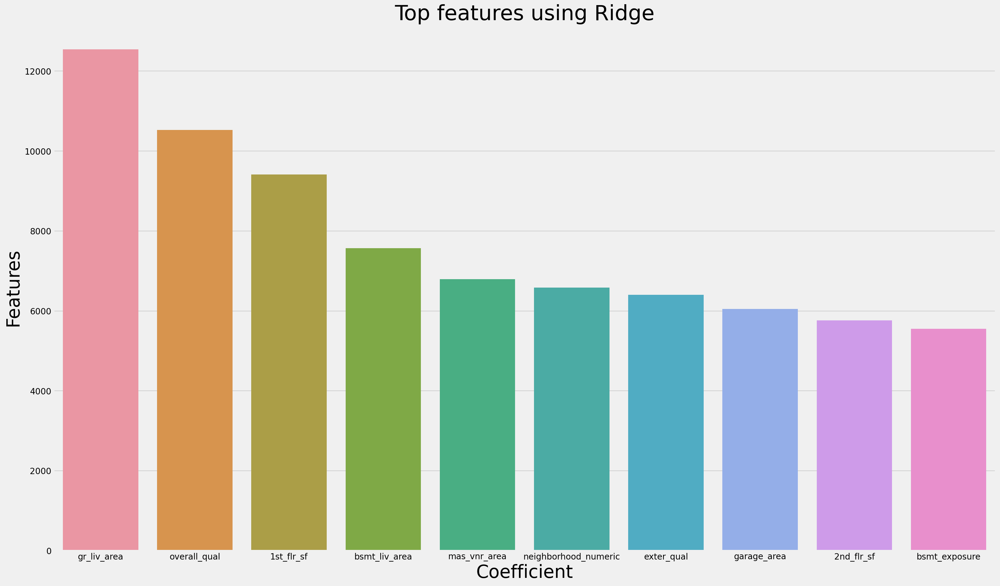

In [56]:
# For a nice visualization.
plt.figure(figsize=(25,15))
sns.barplot(data=ridgetop10, x='variable', y='coef')
plt.xticks
plt.title('Top features using Ridge', fontsize = 35)
plt.xlabel('Coefficient', fontsize=30)
plt.ylabel('Features', fontsize = 30);

The top 10 features that impact saleprice based on Ridge. Notice too that they are all positively correlated to saleprice, meaning an increase in any of these features will up the saleprice. 

In [57]:
# To export the data for our analysis in codebook part 3.
ridge_coefs.to_csv('output/ridge_coefs.csv')

**GridSearch**

Trying out GridSearch on Lasso to see the optimal parameters picked out. 

In [58]:
from sklearn.model_selection import GridSearchCV

In [59]:
lasso_params = {'alpha':np.linspace(0.5, 1.0, 100)}

In [60]:
from sklearn.linear_model import Lasso

In [61]:
lasso_gs = GridSearchCV(Lasso(), param_grid=lasso_params, cv=5)

In [62]:
lasso_gs.fit(X_train_sc, y_train);

In [63]:
lasso_gs.best_score_

0.8863007650077819

In [64]:
lasso_gs.best_params_

{'alpha': 1.0}

In [65]:
print(lasso_gs.score(X_train_sc, y_train))
print(lasso_gs.score(X_test_sc, y_test))

0.9180185584735017
0.8893526790520025


I am getting the same results as my LassoCV earlier which is correct since my earlier use of LassoCV opted for auto choice of optimum alpha. 

In [66]:
lasso_gs.cv_results_

{'mean_fit_time': array([0.20050273, 0.19481516, 0.19334536, 0.19913945, 0.18797359,
        0.17875409, 0.18758597, 0.17654066, 0.18554425, 0.18922577,
        0.16773782, 0.19816666, 0.19588556, 0.21975942, 0.21318092,
        0.1858779 , 0.17215338, 0.24103189, 0.20574417, 0.19192252,
        0.20845184, 0.19750957, 0.18081932, 0.18547502, 0.19015651,
        0.1780663 , 0.17790418, 0.18989067, 0.19250493, 0.20492539,
        0.20223083, 0.20443101, 0.20319233, 0.19351549, 0.21447325,
        0.21113863, 0.18582892, 0.19514651, 0.19507198, 0.1963594 ,
        0.16715145, 0.1928432 , 0.19460683, 0.19785213, 0.20474968,
        0.21230927, 0.18915973, 0.20613775, 0.20366936, 0.19529638,
        0.20530567, 0.21505752, 0.21377997, 0.20630369, 0.21624565,
        0.20603032, 0.17897496, 0.18914738, 0.18629713, 0.16830859,
        0.17890182, 0.16289487, 0.16983609, 0.1756927 , 0.17387552,
        0.17565913, 0.16859088, 0.17217498, 0.17867079, 0.18384428,
        0.18078032, 0.18816457,

In [67]:
pd.DataFrame(lasso_gs.cv_results_).sort_values('rank_test_score').head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
99,0.183298,0.011992,0.001310,0.000898,1.0,{'alpha': 1.0},0.892796,0.871933,0.891074,0.875184,0.900517,0.886301,0.010928,1
98,0.180194,0.020098,0.001397,0.000489,0.994949,{'alpha': 0.994949494949495},0.892795,0.871933,0.891074,0.875184,0.900517,0.886301,0.010928,2
97,0.187474,0.016572,0.001904,0.000655,0.989899,{'alpha': 0.98989898989899},0.892794,0.871932,0.891074,0.875185,0.900517,0.886300,0.010928,3
96,0.192464,0.013214,0.002195,0.000398,0.984848,{'alpha': 0.9848484848484849},0.892793,0.871932,0.891074,0.875185,0.900517,0.886300,0.010928,4
95,0.175057,0.012523,0.001486,0.000581,0.979798,{'alpha': 0.9797979797979799},0.892792,0.871931,0.891074,0.875185,0.900517,0.886300,0.010928,5


All the suggested sets of parameters give the mean cv scores that are very close so they are equally good.

### Further evaluation

Since Ridge gave better scores, I pick out the top 10 contributing features to do a pairplot.

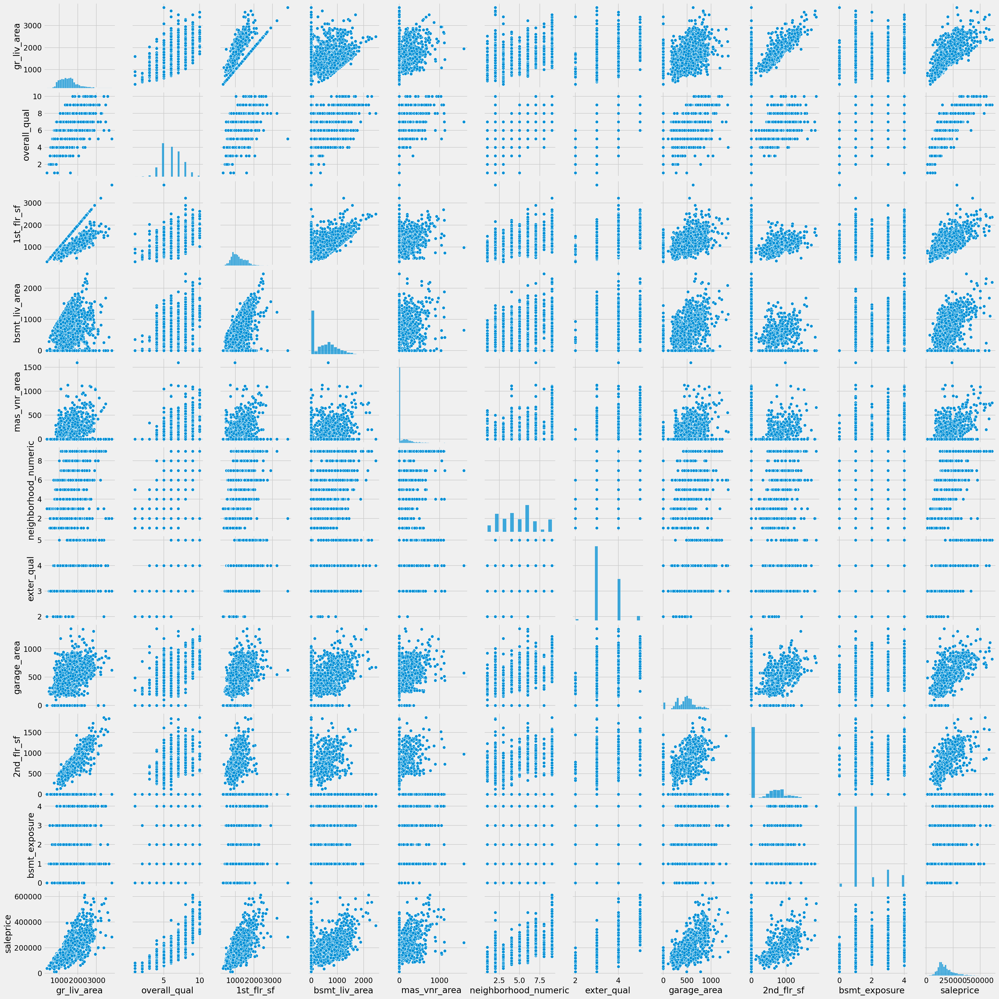

In [61]:
sns.pairplot(df[['gr_liv_area', 'overall_qual', '1st_flr_sf', 'bsmt_liv_area', 'mas_vnr_area', 'neighborhood_numeric',
                 'exter_qual', 'garage_area', '2nd_flr_sf', 'bsmt_exposure', 'saleprice']], palette='tab10');

As expected, the top 10 features show a positive relationship with saleprice.  

Some of the features identified here are unchangeable ie 1st floor sf, so it may not be useful information to sellers since they cannot alter the sf sizes of their existing property. It will however be important information for buyers looking to optimise their next purchase. We will talk more on this when doing up the conclusion to fit the business problem.


### Kaggle submission

In [126]:
# Read the test data to test my model on.
test = pd.read_csv('datasets/test.csv')
print(test.shape)
test.head()

(878, 80)


,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
0,2658,902301120,190,RM,69.0,9142,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,Fa,Stone,Fa,TA,No,Unf,0,Unf,0,1020,1020,GasA,Gd,N,FuseP,908,1020,0,1928,0,0,2,0,4,2,Fa,9,Typ,0,NaN,Detchd,1910.0,Unf,1,440,Po,Po,Y,0,60,112,0,0,0,NaN,NaN,NaN,0,4,2006,WD
1,2718,905108090,90,RL,NaN,9662,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,5,4,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,Unf,0,Unf,0,1967,1967,GasA,TA,Y,SBrkr,1967,0,0,1967,0,0,2,0,6,2,TA,10,Typ,0,NaN,Attchd,1977.0,Fin,2,580,TA,TA,Y,170,0,0,0,0,0,NaN,NaN,NaN,0,8,2006,WD
2,2414,528218130,60,RL,58.0,17104,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,Gd,Av,GLQ,554,Unf,0,100,654,GasA,Ex,Y,SBrkr,664,832,0,1496,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2006.0,RFn,2,426,TA,TA,Y,100,24,0,0,0,0,NaN,NaN,NaN,0,9,2006,New
3,1989,902207150,30,RM,60.0,8520,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,5,6,1923,2006,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,Gd,TA,CBlock,TA,TA,No,Unf,0,Unf,0,968,968,GasA,TA,Y,SBrkr,968,0,0,968,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1935.0,Unf,2,480,Fa,TA,N,0,0,184,0,0,0,NaN,NaN,NaN,0,7,2007,WD
4,625,535105100,20,RL,NaN,9500,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1963,1963,Gable,CompShg,Plywood,Plywood,BrkFace,247.0,TA,TA,CBlock,Gd,TA,No,BLQ,609,Unf,0,785,1394,GasA,Gd,Y,SBrkr,1394,0,0,1394,1,0,1,1,3,1,TA,6,Typ,2,Gd,Attchd,1963.0,RFn,2,514,TA,TA,Y,0,76,0,0,185,0,NaN,NaN,NaN,0,7,2009,WD


In [63]:
# Check for missing values.
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               878 non-null    int64  
 1   PID              878 non-null    int64  
 2   MS SubClass      878 non-null    int64  
 3   MS Zoning        878 non-null    object 
 4   Lot Frontage     718 non-null    float64
 5   Lot Area         878 non-null    int64  
 6   Street           878 non-null    object 
 7   Alley            58 non-null     object 
 8   Lot Shape        878 non-null    object 
 9   Land Contour     878 non-null    object 
 10  Utilities        878 non-null    object 
 11  Lot Config       878 non-null    object 
 12  Land Slope       878 non-null    object 
 13  Neighborhood     878 non-null    object 
 14  Condition 1      878 non-null    object 
 15  Condition 2      878 non-null    object 
 16  Bldg Type        878 non-null    object 
 17  House Style     

In [64]:
# Doing the same as we did for train set earlier when cleaning up data.
test = test.drop(columns = ['Mo Sold', 'Yr Sold', 'Sale Type', 'Pool QC'])
# Creating new column 'Bsmt Liv Area' which is the difference between the Total Bsmt SF and Bsmt Unf SF.
test['Bsmt Liv Area'] = test['Total Bsmt SF'] - test['Bsmt Unf SF']

In [65]:
# Dropping all extra info about basement.
test = test.drop(columns = ['BsmtFin Type 1', 'BsmtFin SF 1',
       'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF'])

In [66]:
# Impute zero.
test['Bsmt Liv Area'] = test['Bsmt Liv Area'].replace(np.nan, 0)
# Alley --> replace nan with 0.
test['Alley'] = test['Alley'].replace(np.nan, 0)

In [67]:
# Create a new column to binarize whether there is (1) or is no (0) alley.
def alley(type):
    if type == 0: 
        return 0
    else: 
        return 1

# Apply it to a new column.
test['Have alley'] = test['Alley'].apply(alley)

In [68]:
# Then proceed to drop 'alley' column.
test = test.drop(columns = ['Alley'])
# Fence --> replace nan with 0 since there are no fences.
test['Fence'] = test['Fence'].replace(np.nan, 0)
# Fireplace Qu --> replace nan with 0 since there are no fireplaces.
test['Fireplace Qu'] = test['Fireplace Qu'].replace(np.nan, 0)
# Mas Vnr Area --> replace nan with 0 since there is no such feature in these rows.
test['Mas Vnr Area'] = test['Mas Vnr Area'].replace(np.nan, 0)
# Mas Vnr Type --> replace nan with 0 since there is no such feature in these rows.
test['Mas Vnr Type'] = test['Mas Vnr Type'].replace(np.nan, 0)

In [69]:
# Dropping all extra info about garage except 'Garage Area', quality and condition.
test = test.drop(columns = ['Garage Type', 'Garage Yr Blt',
       'Garage Finish', 'Garage Cars'])

In [70]:
# Create a new column to binarize whether there is (1) or is no (0) garage.
# Define my argument.
def garage(area):
    if area == 0: 
        return 0
    else: 
        return 1

# Apply it to a new column.
test['Garage'] = test['Garage Area'].apply(garage)

In [71]:
# Imputing zero to the rest of the missing values since they do not exist in these rows.
test['Garage Area'] = test['Garage Area'].replace(np.nan, 0)
test['Bsmt Qual'] = test['Bsmt Qual'].replace(np.nan, 0)
test['Bsmt Cond'] = test['Bsmt Cond'].replace(np.nan, 0)
test['Bsmt Exposure'] = test['Bsmt Exposure'].replace(np.nan, 0)
test['Bsmt Half Bath'] = test['Bsmt Half Bath'].replace(np.nan, 0)
test['Bsmt Full Bath'] = test['Bsmt Full Bath'].replace(np.nan, 0)
test['Garage Qual'] = test['Garage Qual'].replace(np.nan, 0)
test['Garage Cond'] = test['Garage Cond'].replace(np.nan, 0)
test['Misc Feature'] = test['Misc Feature'].replace(np.nan, 0)

In [72]:
# Imputing the missing values in 'Lot Frontage' with the mean.
test['Lot Frontage'] = test['Lot Frontage'].fillna(round(test['Lot Frontage'].mean(), 1))

In [73]:
test.head()

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Fence,Misc Feature,Misc Val,Bsmt Liv Area,Have alley,Garage
0,2658,902301120,190,RM,69.0,9142,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,Fa,Stone,Fa,TA,No,GasA,Gd,N,FuseP,908,1020,0,1928,0,0,2,0,4,2,Fa,9,Typ,0,0,440,Po,Po,Y,0,60,112,0,0,0,0,0,0,0,1,1
1,2718,905108090,90,RL,69.5,9662,Pave,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,5,4,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,GasA,TA,Y,SBrkr,1967,0,0,1967,0,0,2,0,6,2,TA,10,Typ,0,0,580,TA,TA,Y,170,0,0,0,0,0,0,0,0,0,0,1
2,2414,528218130,60,RL,58.0,17104,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,Gd,Av,GasA,Ex,Y,SBrkr,664,832,0,1496,1,0,2,1,3,1,Gd,7,Typ,1,Gd,426,TA,TA,Y,100,24,0,0,0,0,0,0,0,554,0,1
3,1989,902207150,30,RM,60.0,8520,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,5,6,1923,2006,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,Gd,TA,CBlock,TA,TA,No,GasA,TA,Y,SBrkr,968,0,0,968,0,0,1,0,2,1,TA,5,Typ,0,0,480,Fa,TA,N,0,0,184,0,0,0,0,0,0,0,0,1
4,625,535105100,20,RL,69.5,9500,Pave,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1963,1963,Gable,CompShg,Plywood,Plywood,BrkFace,247.0,TA,TA,CBlock,Gd,TA,No,GasA,Gd,Y,SBrkr,1394,0,0,1394,1,0,1,1,3,1,TA,6,Typ,2,Gd,514,TA,TA,Y,0,76,0,0,185,0,0,0,0,609,0,1


In [74]:
# Changing all the column names to lower case and replacing space with underscore. 
# Should have done this in the data cleaning stage. 
test.columns = test.columns.str.lower().str.replace(' ', '_')

In [75]:
# Identifying the ordinal columns.
test_ordinal_col = test[['lot_shape','utilities','ms_zoning','street','land_slope','exter_qual', 'exter_cond','bsmt_qual', 'bsmt_cond', 'bsmt_exposure', 'heating_qc','electrical','kitchen_qual','functional','fireplace_qu','garage_qual','garage_cond','paved_drive', 'fence']]

#dictionary of values I want to replace
dict_ordinal = {
    #exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,heatingqc,kitchenqual
    #firplacequ,garage_qual,garage_cond,fence
    'Ex': 5,
    'Gd': 4,
    'TA': 3,
    'Fa': 2,
    'Po': 1,
    'NA': 0,
    '0': 0, 
    #ms_zoning: 0 if non residential, 1 if residential
    'A (agr)':0,
    'I (all)':0,
    'C (all)':0,
    'RM':1,
    'RH':1,
    'RL':1,
    'FV':1,
     #lot_shape
    'Reg':4,
    'IR1':3,
    'IR2':2,
    'IR3':1,
    #street: 0 for gravel since it's cheaper ie lower grade, 1 for pave
    'Pave': 1,
    'Grvl': 0,
    #utilities
    'AllPub':4,
    'NoSewr':3,
    'NoSeWa':2,
    'ELO':1,
    #land_slope
    'Gtl':3,
    'Mod':2,
    'Sev':1,
    #bsmt_exposure
    'Av': 3,
    'Mn': 2,
    'No': 1,
    #Electrical
    'SBrkr':1,
    'FuseA':0,
    'FuseF':0,
    'FuseP':0,
    'Mix':0,
    #Functional
    'Typ':1,
    'Min1':0,
    'Min2':0,
    'Mod':0,
    'Maj1':0,
    'Maj2':0,
    'Sev':0,
    'Sal':0,
    #paved_drive
    'Y' : 2,
    'P' : 1,
    'N' : 0,
    #fence
    'GdPrv':4,
    'MnPrv':3,
    'GdWo':2,
    'MnWw':1   
}

#loop to get the job done
for i in test_ordinal_col.columns:
    test.replace({i: dict_ordinal},inplace = True)

In [76]:
# Noted that condition_1 and condition_2 can be assigned numberical values.
# Assign 0 to a negative condition, 1 to a normal condition and 2 to a positive condition.
test_ordinal_col = test[['condition_1', 'condition_2']]

dict_ordinal = {
   'Artery':0,
    'RRNe':0,
    'RRAe':0,
    'Feedr':0,
    'RRAn':0,
    'Norm':1,
    'RRNn':0,
    'PosN':2,
    'PosA':2,
        }

#loop to get the job done
for i in test_ordinal_col.columns:
    test.replace({i: dict_ordinal},inplace = True)
# Both condition scores can be combined into 1 column.
test['comb_conditions'] = test['condition_1']+test['condition_2'] 
# Then drop the 2 orig columns.
test = test.drop(columns = ['condition_1', 'condition_2'])

In [77]:
# Assign numerical values to the neighborhoods.
test['neighborhood_numeric'] =test['neighborhood'].map(neigh_map)

In [78]:
# Drop 'neighborhood' column since we have the numeric column now.
test = test.drop(columns = ['neighborhood'])

In [79]:
# Preparing our X variables.
Xtest = test[features]

# Doing one hot encoding to the nominal columns.
Xtest = pd.get_dummies(data=Xtest, columns=['land_contour', 'lot_config', 'bldg_type',
                                    'house_style', 'roof_style', 'roof_matl', 'exterior_1st', 'exterior_2nd', 'mas_vnr_type', 
                                    'foundation', 'heating', 'central_air', 'misc_feature'], drop_first=True)

In [80]:
X.shape

(2045, 127)

In [81]:
Xtest.shape

(878, 126)

This difference of 1 column bugged me for days. I ended up getting Samuel's help to overcome this issue and finally managed to do two Kaggle submissions. 

In [82]:
s = set(X.columns)
t = set(Xtest.columns)
u = [x for x in t if x not in s]
u

['exterior_2nd_Other',
 'mas_vnr_type_CBlock',
 'exterior_1st_PreCast',
 'roof_matl_Roll',
 'heating_GasA',
 'roof_matl_Metal',
 'exterior_2nd_PreCast']

In [83]:
v = [a for a in s if a not in t]
v

['heating_Wall',
 'exterior_2nd_Stone',
 'exterior_1st_Stone',
 'roof_matl_Membran',
 'exterior_1st_ImStucc',
 'misc_feature_TenC',
 'heating_OthW',
 'exterior_1st_CBlock']

In [84]:
for c_n in u:
    Xtest.drop(columns=c_n,inplace=True)

In [85]:
for c_n in v:
    Xtest[c_n] = 0

In [90]:
# Doing this because there was 1 stubborn Nan left.
Xtest['electrical'] = Xtest['electrical'].replace(np.nan, 0)

In [92]:
X_tested = ss.transform(Xtest)

In [105]:
# Fitting our lasso model on this new test data.
Xtest['Saleprice'] = lasso_cv.predict(X_tested)

In [116]:
# Creating my df with only the columns needed.
lasso_pred = Xtest[['id', 'Saleprice']]
lasso_pred = lasso_pred.set_index('id')
lasso_pred.head()

,Saleprice
id,
2658,153132.749914
2718,202508.003375
2414,229810.552454
1989,163761.803847
625,246140.776352


In [117]:
# To export the data for Kaggle submission.
lasso_pred.to_csv('output/lasso_pred.csv')

In Kaggle, my score for this Lasso prediction was approx 60K. Not surprising since Lasso was not exactly my best performing model. Will try using Ridge to submit another entry on Kaggle.

In [122]:
# Using the same Xtest df but remove the Saleprice predicted by Lasso first.
Xtest = Xtest.drop(columns = ['Saleprice'])

In [123]:
# Fitting our ridge model on this new test data.
Xtest['Saleprice'] = ridge_cv.predict(X_tested)

In [124]:
# Creating my df with only the columns needed.
ridge_pred = Xtest[['id', 'Saleprice']]
ridge_pred = ridge_pred.set_index('id')
ridge_pred.head()

,Saleprice
id,
2658,134022.174832
2718,173260.567598
2414,213787.183093
1989,122956.660386
625,210148.179049


In [125]:
# To export the data for Kaggle submission.
ridge_pred.to_csv('output/ridge_pred.csv')

Kaggle gave me a score of approx 30K for this set of Ridge predictions. I'm actually quite happy to have submitted successfully and to get a decent score. Hurray! 

![](https://snipboard.io/uerqzc.jpg)